### **Car color regognition model: Single Shot Detector -> Fully convolutional for segmentation -> 2D histogram -> classification**

#### **Определение цвета автомобилей по изображению: Single Shot Detector -> Fully convolutional для сегментации -> 2D гистограмма -> классификация**



На массиве изображений с автомобилями необходимо определить их цвет в пространстве RGB. Если на изображении несколько автомобилей, необходимо определить цвет для каждого. 
Используя открытые источники сформировать и подготовить выборку изображений с автомобилями. 

Входные данные:
    Изображение

Выходные данные:
    Список кортежей, каждый из которых содержит значения каналов RGB (три целых числа от 0 до 255) 

#### **Уточнение условий**

Значения каналов RGB на фотографии не являются свойством объекта (автомобиля). Помимо самого объекта, RGB каждого пикселя определяется:
* Интенсивностью и спектром источников освещения
* Углами падения и отражения света, попадающего от конкретных точек объекта в объектив камеры
* Экспозицией кадра
* Зеркальным отражением прочих объектов в поверхности рассматриваемого объекта
* Контекстом всего кадра, который определяет автоматические настройки при постобработке кадра в камере

Задачу об RGB объекта можно было бы сформулировать в виде "определить соотношение интенсивности каналов RGB в потоке отраженного белого света при нормальном падении". Однако такому соотношению RGB может не соответствовать вообще ни один пиксель кадра.
 
**В результате обсуждения с заказчиком условие задачи было сформулировано в следующем виде:** определить принадлежность автомобилей к одному из цветов фиксированного набора (черный, синий, зеленый, серый, оранжевый, желтый, красный).


### **Аннотация**

В проекте рассматривались изображения с уличных карт Google Maps, на каждом из которых было несколько автомобилей. Цветовая категория верно определялась приблизительно для 90% локализованных при сегментации изображения автомобилей. При этом корректно локализовывались все автомобили, которые целиком попадали в кадр и ГРИП (глубину резко изображаемого пространства) объектива и которые не были замылены при постобработе (скрытии номера). В решении были использованы готовые модели библиотеки Pytorch для сегментации изображения и обучены модели SVM и LightGBM для классификации.

### **Применение решения**

Поместить исходные изображения в формате .jpg в папку 'input_images' и выполнить программу. Результат помещается в папку 'output_images' в виде обработанных изображений, где локализованные автомобили помечены рамкой и для них подписан цвет. При этом по умолчанию модель классификации загружается из файла. Для обучения модели классификации необходимо загрузить датасет и изменить значение переменной skip_training_and_load_classifier_from_file.

### **Описание решения**

#### 1. <ins>Локализация объектов</ins>
Первичная локализацая автомобилей выполнялась при помощи модели архитектуры **Single Shot MultiBox Detector (SSD)** из библиотеки Pytorch на основе нейронной сети ResNet50. Модель была предобучена на датасете COCO. Размер входного изображения составлял 300х300 пикселей.

#### 2. <ins>Сегментация изображения</ins>
Изображение сегментировалось при помощи сверточной модели архитектуры **Fully-Convolutional Network (FCN)** из библиотеки Pytorch на основе нейронной сети ResNet50. Модель была предобучена на части датасета COCO и имеет 21 выходной слой, т.е. определяет принадлежность пикселей изображения одному из 20 классов. В результате применения данной модели формировалась маска, определяющая принадлежность пикселей ограничивающего прямоугольника локализованным автомобилям.

#### 3. <ins>Классификация объектов</ins>
Определение цвета автомобиля по выделенным маской пикселям является задачей классификации. Данной задаче посвящено множество научных работ, например [1-3], из которых можно выделить следующие общие пункты:
* Задача не имеет полноценного решения, точность в относительно современных работах находится на уровне 95% по метрике mean average precision (mAP) [3]
* Классификация цветов лучше работает в цветовом пространстве HSx (HSB, HSL, HSI и.т.д.)
* В современных работах классификация выполняется с помощью глубоких нейронных сетей, содержащих до $10^{8}$ параметров [3]
* Задача существенно усложняется с увеличением количества рассматриваемых оттенков
* При небольшом количестве классов неплохая точность может быть достигнута методами классического ML с признаками в виде двумерной гистограммы пикселей по параметрам hue и saturation [4]
* Предварительная обработка фотографий (de-hazing) позволяет значительно улучшить качество предсказаний

В рамках данного проекта классификация выполнялась усреднением по ансамблю моделей градиентного бустинга (**LightGBM**) и метода опорных векторов (**SVM**). Признаки формировались следующим образом:
* отбор пикселей по сегментирующей маске
* 2D гистограмма пикселей по параметрам hue и saturation размером 10х10
* гистограмма пикселей по параметру brightness размером 50

При классификации использовалось 8 цветов (черный, синий, зеленый, серый, оранжевый, желтый, красный). Модели были обучены на основе данных из "VCoR (Vehicle Color Recognition) Dataset" с Kaggle (https://www.kaggle.com/datasets/landrykezebou/vcor-vehicle-color-recognition-dataset). Ввиду незначительного дисбаланса классов в датасете использовалась метрика **accuracy**. 

#### 4. <ins>Основные результаты и выводы</ins>
* Достигнутая точность **ансамбля моделей LightGBM и SVM** для изображений отдельных автомобилей из тестовой выборки составляет **92%** по метрике **accuracy**, причем не менее трети ошибок являются ошибками разметки.
* Отдельно модели LightGBM и SVM показали сравнимую точность на уровне 90-91%
* Цветовая категория верно определялась приблизительно для 90% локализованных при сегментации автомобилей из типичных уличных фотографий Google Maps
* Качество предсказаний за счет предварительной обработки фотографий (de-hazing) улучшить не удалось
* Модель много ошибается при определении цвета белых машин, поскольку их цвет часто и значительно искажается на фотографиях

#### 5. <ins>Возможности для улучшения результатов</ins>
В качестве очевидных шагов для дальнейшего улучшения классификации следует рассматривать:
* Ручную очистку данных от ошибок разметки
* Пополнение обучающей выборки за счет других доступных фотографий и аугментации, особенно для белых автомобилей
* Обучение простой нейронной сети для классификации в составе ансамбля моделей
* Обучение полноразмерной нейронной сети

#### 6. <ins>Список литературы</ins>

1. Rachmadi, R.F., Purnama, K.E., **Vehicle Color Recognition using Convolutional Neural Network**, *arXiv e-prints*, **2018**, https://arxiv.org/abs/1510.07391
2. Tariq A, Khan M Z, Khan M U G. **Real time vehicle detection and colour recognition using tuned features of faster-RCNN**, *Proceedings of the 1st International Conference on Artificial Intelligence and Data Analytics.* **2021**, 262–267 https://doi.org/10.1109/CAIDA51941.2021.9425106
3. Hu, M., Bai, L., Fan, J. et al. **Vehicle color recognition based on smooth modulation neural network with multi-scale feature fusion.** *Front. Comput. Sci.* 17, 173321 **2023**. https://doi.org/10.1007/s11704-022-1389-x 
4. Chen P, Bai X, Liu W Y. **Vehicle color recognition on urban road by feature context**. *IEEE Transactions on Intelligent Transportation Systems*, **2014**, 15(5): 2340–2346 https://doi.org/10.1109/TITS.2014.2308897

#### 7. <ins>Код</ins>


##### 7.1. Инициализация

In [1]:
# папка для обрабатываемых изображений
input_image_folder = 'input_images'

# папка результатов
output_image_folder = 'output_images'

# папка для обрабатываемых изображений
skip_training_and_load_classifier_from_file = True

In [2]:
import numpy as np
import pandas as pd
import math
import torch
from PIL import Image
from torchvision import transforms

from skimage.color import rgb2hsv
from matplotlib.colors import hsv_to_rgb

import lightgbm
from sklearn import svm
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.metrics import accuracy_score
from sklearn.utils import shuffle

from tqdm import tqdm
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import itertools

import glob
import os
from pathlib import Path
import joblib

In [3]:
# параметры пиксельных гистограмм для классификации
# двумерная hue*saturation и одномерная brightness
hue_bins, saturation_bins, brightness_bins = 10, 10, 50

# минимальная доля площади, занимаемой пикселями автомобиля, в тренировочных кадрах
car_fraction_limit = 0.2

# тренировочный датасет
data_folder_kaggle = os.path.join('data', 'Cars color recognition from kaggle fixed2')

In [4]:
# сверточная FCN сеть для сегментирования изображений
model_FCN = torch.hub.load('pytorch/vision:v0.10.0', 'fcn_resnet50', pretrained=True)
model_FCN.eval()
model_FCN.to('cuda')
torch.no_grad()

# сеть архитектуры SSD300 на основе ResNet50 для локализации объектов
model_SSD = torch.hub.load('NVIDIA/DeepLearningExamples:torchhub', 'nvidia_ssd')
utils = torch.hub.load('NVIDIA/DeepLearningExamples:torchhub', 'nvidia_ssd_processing_utils')
model_SSD.to('cuda')
model_SSD.eval()

Using cache found in C:\Users\Ya/.cache\torch\hub\pytorch_vision_v0.10.0
c:\ProgramData\Anaconda3\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\ProgramData\Anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FCN_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=FCN_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Using cache found in C:\Users\Ya/.cache\torch\hub\NVIDIA_DeepLearningExamples_torchhub
C:\Users\Ya/.cache\torch\hub\NVIDIA_DeepLearningExamples_torchhub\PyTorch\Classification\ConvNets\image_classification\models\common.py:13: UserWarning: pytorch_quantization module not found, q

SSD300(
  (feature_extractor): ResNet(
    (feature_extractor): Sequential(
      (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
      (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (4): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (relu): ReLU(inplac

##### 7.2. Служебные функции

In [5]:
# сегментирование моделью FCN
def transform_image_FCN(image, model_FCN):
    input_array = np.array(image, dtype=np.float32)/255 \
                    if np.array(image).max()>1 else np.array(image)
    preprocess = transforms.Compose([ transforms.ToTensor(),
                                    transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                                     std=[0.229, 0.224, 0.225]) ])

    input_tensor = preprocess(input_array)
    input_batch = input_tensor.unsqueeze(0)
    input_batch = input_batch.to('cuda')
    with torch.no_grad():
        output = model_FCN(input_batch)['out'][0]
    return output.argmax(0)

In [6]:
# вычисление доли кадра, занимаемой объектом
def car_fraction_from_FCN(image_FCN):
    img = image_FCN.flatten()
    if img.nonzero().shape[0]==0:
        return 0
    else:
        bincount = torch.bincount(img)
        max_class_sum = bincount[1:].max().cpu()
    return max_class_sum / img.size()[0]

In [7]:
# построение пиксельной маски объекта
def car_mask_from_FCN(image):
    if image.nonzero().shape[0]==0:
        #print('zero mask warning!')
        return torch.ones_like(image)
     
    bincount = torch.bincount(image.flatten())
    max_class = bincount[1:].argmax() + 1
    return torch.where(image == max_class, 1., 0.)

In [8]:
# построение признаков
def process_image_FCN(image, model_FCN=None, image_FCN=None, hue_bins=hue_bins, saturation_bins=saturation_bins, brightness_bins=brightness_bins):
    hsv = rgb2hsv(np.array(image))
    image_size = hsv.shape[0] * hsv.shape[1]
    hsv_masked = hsv
    fraction=1

    if model_FCN is not None:
        image_FCN = transform_image_FCN(image, model_FCN)
    if image_FCN is not None:
        mask_FCN = car_mask_from_FCN(image_FCN)
        mask_FCN_np = mask_FCN.cpu().numpy()[:,:,None]
        hsv_masked = hsv*mask_FCN_np - (mask_FCN_np-1)*2
        fraction = mask_FCN_np.sum() / image_size
    
    hs = hsv_masked[:,:,:2]
    hs_histogram = np.histogram2d( hs.reshape(-1, 2)[:,0], hs.reshape(-1, 2)[:,1], 
                                   bins=(hue_bins, saturation_bins), 
                                   range=((0,1), (0,1)) )[0].flatten() / image_size / fraction

    if brightness_bins>0:
        brightness_histogram = np.histogram( hsv_masked[:,:,2].flatten(), bins=(brightness_bins), range=(0,1) )[0].flatten() / image_size / fraction
        return  np.concatenate( (hs_histogram, brightness_histogram) )
    else:
        return  hs_histogram

In [9]:
# построение признаков
def process_image_FCN(image, image_FCN, hue_bins=hue_bins, saturation_bins=saturation_bins, brightness_bins=brightness_bins):
    hsv = rgb2hsv(np.array(image))
    image_size = hsv.shape[0] * hsv.shape[1]

    mask_FCN = car_mask_from_FCN(image_FCN)
    mask_FCN_np = mask_FCN.cpu().numpy()[:,:,None]
    hsv_masked = hsv*mask_FCN_np - (mask_FCN_np-1)*2
    fraction = mask_FCN_np.sum() / image_size
    
    hs = hsv_masked[:,:,:2]
    hs_histogram = np.histogram2d( hs.reshape(-1, 2)[:,0], hs.reshape(-1, 2)[:,1], 
                                   bins=(hue_bins, saturation_bins), 
                                   range=((0,1), (0,1)) )[0].flatten() / image_size / fraction

    if brightness_bins>0:
        brightness_histogram = np.histogram( hsv_masked[:,:,2].flatten(), bins=(brightness_bins), range=(0,1) )[0].flatten() / image_size / fraction
        return  np.concatenate( (hs_histogram, brightness_histogram) )
    else:
        return  hs_histogram

In [10]:
# чтение обучающей/валидационной/тестовой выборок и построение признаков
def process_kaggle_dataset(subfolder_name, model_FCN=None, hue_bins=hue_bins, saturation_bins=saturation_bins, brightness_bins=brightness_bins):
    p = Path(subfolder_name)
    colors = [x.name for x in p.iterdir() if x.is_dir()]
    image_list = []
    feature_list = []
    target_list = []
    for idx, color in tqdm(enumerate(colors)):
        for filename in glob.glob( os.path.join(subfolder_name, color, '*.jpg') ):
            image = Image.open(filename)
            image_FCN = transform_image_FCN(image, model_FCN)
            car_fraction = car_fraction_from_FCN(image_FCN)
            if car_fraction > car_fraction_limit:
                features = process_image_FCN(image, image_FCN=image_FCN, hue_bins=hue_bins, saturation_bins=saturation_bins, brightness_bins=brightness_bins)
                image_list.append( image )
                feature_list.append( features )
                target_list.append(idx)
        
    return image_list, np.array(feature_list), np.array(target_list), colors

In [11]:
# классификатор
class OneCarClassifier:
    def __init__(self, model_list, car_colors, hue_bins, saturation_bins, brightness_bins) -> None:
        self.model_list = model_list
        self.car_colors = car_colors
        self.hue_bins = hue_bins
        self.saturation_bins = saturation_bins
        self.brightness_bins = brightness_bins

    def detect_car_color(self, image, image_FCN=None):
        features = process_image_FCN(image, image_FCN=image_FCN, hue_bins=self.hue_bins, saturation_bins=self.saturation_bins, brightness_bins=self.brightness_bins)
        predictions_proba = np.mean([model.predict_proba(features[None,:]) for model in self.model_list], axis=0)
        return self.car_colors[np.argmax(predictions_proba)]

##### 7.3. Чтение обучающей/валидационной/тестовой выборок и построение признаков

In [12]:
# определение классов
if not skip_training_and_load_classifier_from_file:
    p = Path( os.path.join(data_folder_kaggle, 'train') )
    subdirectories = [x.name for x in p.iterdir() if x.is_dir()]

    print(subdirectories)
    car_colors = subdirectories

['black', 'blue', 'green', 'grey', 'orange', 'red', 'white', 'yellow']


In [13]:
# чтение обучающей/валидационной/тестовой выборок и построение признаков
# итерации tqdm соответствуют цветовым классам, всего их 8
# характерное время выполнения - 20 минут
if not skip_training_and_load_classifier_from_file:
    images_train_kaggle, features_train_kaggle, targets_train_kaggle, train_dataset_colors = process_kaggle_dataset(data_folder_kaggle+'\\train', model_FCN=model_FCN, 
                                                                                                hue_bins=hue_bins, saturation_bins=saturation_bins, brightness_bins=brightness_bins)
    images_valid_kaggle, features_valid_kaggle, targets_valid_kaggle, valid_dataset_colors = process_kaggle_dataset(data_folder_kaggle+'\\val', model_FCN=model_FCN, 
                                                                                                hue_bins=hue_bins, saturation_bins=saturation_bins, brightness_bins=brightness_bins)
    images_test_kaggle, features_test_kaggle, targets_test_kaggle, valid_dataset_colors = process_kaggle_dataset(data_folder_kaggle+'\\test', model_FCN=model_FCN, 
                                                                                                hue_bins=hue_bins, saturation_bins=saturation_bins, brightness_bins=brightness_bins)
    print(train_dataset_colors)

8it [15:06, 113.30s/it]
8it [04:07, 30.94s/it]
8it [04:32, 34.05s/it]

['black', 'blue', 'green', 'grey', 'orange', 'red', 'white', 'yellow']


In [23]:
# используемые модели не зависят от порядка объектов, но на всякий случай
if not skip_training_and_load_classifier_from_file:
    shuffled_index_train = shuffle( range(len(targets_train_kaggle)), random_state=42)

Примеры изображений тренировочной выборки

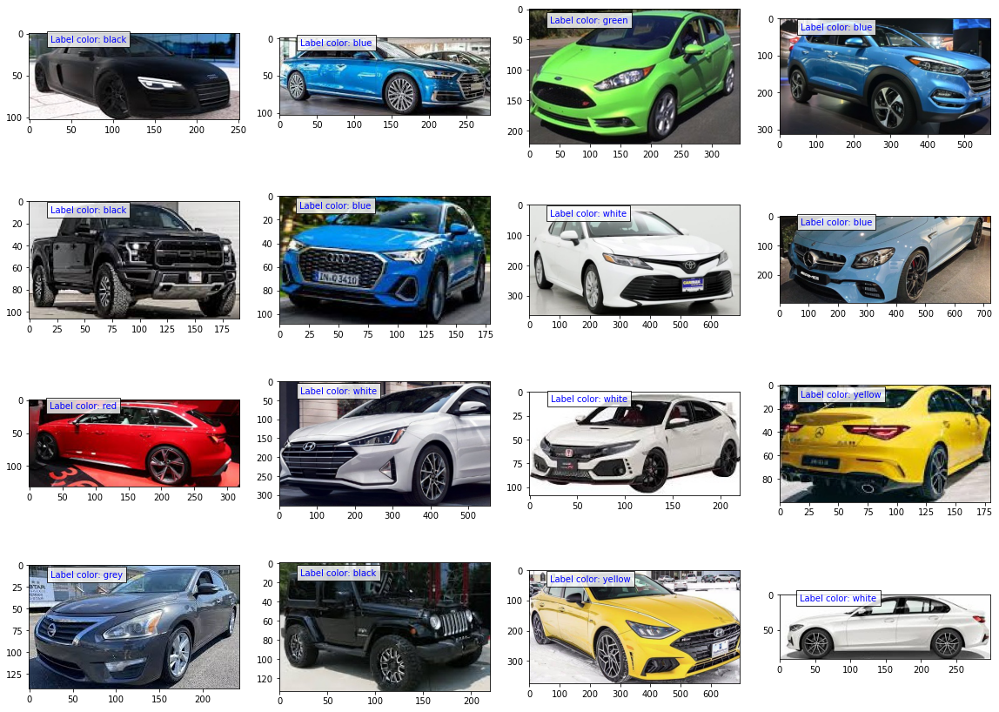

In [24]:
if not skip_training_and_load_classifier_from_file:
    nx = 4
    ny = 4
    fig, axes = plt.subplots(ny, nx, figsize=(16,ny*3))
    axes = axes.flatten()

    for idx, ax in zip( shuffled_index_train, axes):
        image = images_train_kaggle[idx]
        ax.imshow(image)
        sx, sy = int(image.size[0]/10), int(image.size[1]/10)
        ax.text(sx, sy, 'Label color: ' + car_colors[targets_train_kaggle[idx]], color="b", bbox=dict(facecolor='white', alpha=0.8))

    fig.tight_layout()

Набор признаков для тренировки состоит из
* 2D гистограммы пикселей объекта по hue и saturation
* гистограммы пикселей объекта по brightness

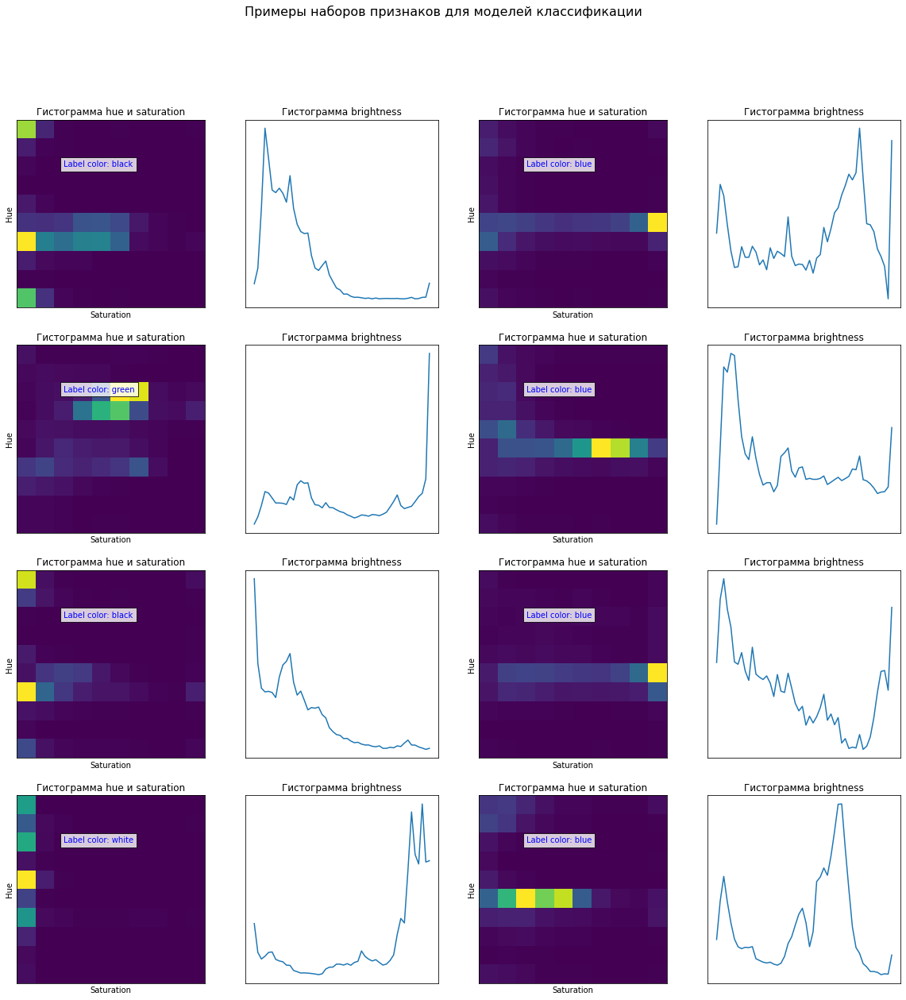

In [25]:
if not skip_training_and_load_classifier_from_file:
    nx = 4
    ny = 4
    x = np.arange(0,1,1/brightness_bins)

    fig, axes = plt.subplots(nx, ny, figsize=(20,ny*5))
    fig.suptitle("Примеры наборов признаков для моделей классификации", fontsize=16)
    for ax, idx in zip(axes.reshape(-1, 2), shuffled_index_train):
        ax[0].imshow( features_train_kaggle[idx][:hue_bins*saturation_bins].reshape(hue_bins, saturation_bins) )
        ax[0].text(2, 2, 'Label color: ' + car_colors[targets_train_kaggle[idx]], color="b", bbox=dict(facecolor='white', alpha=0.8))
        ax[0].title.set_text('Гистограмма hue и saturation')
        ax[0].set_xlabel('Saturation')
        ax[0].set_ylabel('Hue')

        ax[1].plot( features_train_kaggle[idx][hue_bins*saturation_bins:] )
        ax[1].title.set_text('Гистограмма brightness')
        #ax[1].bar(x, features_train_kaggle[idx][hue_bins*saturation_bins:] )


    plt.setp(axes, xticks=[], xticklabels=[], yticks=[])
    #fig.tight_layout()
    plt.show()

##### 7.4. Обучение и валидация моделей

###### 7.4.1 Градиентный бустинг LightGBM

In [26]:
if not skip_training_and_load_classifier_from_file:
    model_lgbm = lightgbm.LGBMClassifier(learning_rate=0.04, n_estimators=1500)
    model_lgbm.fit(features_train_kaggle[shuffled_index_train], targets_train_kaggle[shuffled_index_train])

    print( 'training...', accuracy_score(model_lgbm.predict(features_train_kaggle), targets_train_kaggle) )
    print( 'validation...', accuracy_score(model_lgbm.predict(features_valid_kaggle), targets_valid_kaggle) )

training... 0.999747219413549
validation... 0.925531914893617


###### 7.4.2 Градиентный бустинг LightGBM с нормализацией признаков

In [27]:
if not skip_training_and_load_classifier_from_file:
    model_lgbm_scaled_pipeline = make_pipeline(StandardScaler(), lightgbm.LGBMClassifier(learning_rate=0.04, n_estimators=1500))
    model_lgbm_scaled_pipeline.fit(features_train_kaggle, targets_train_kaggle)

    print( 'training...', accuracy_score(model_lgbm_scaled_pipeline.predict(features_train_kaggle), targets_train_kaggle) )
    print( 'validation...', accuracy_score(model_lgbm_scaled_pipeline.predict(features_valid_kaggle), targets_valid_kaggle) )

training... 0.999747219413549
validation... 0.925531914893617


###### 7.4.3 Метод опорных векторов SVM

In [28]:
if not skip_training_and_load_classifier_from_file:
    model_svm = svm.SVC(probability=True)
    model_svm.fit(features_train_kaggle[shuffled_index_train], targets_train_kaggle[shuffled_index_train])

    print( 'training...', accuracy_score(model_svm.predict(features_train_kaggle), targets_train_kaggle) )
    print( 'validation...', accuracy_score(model_svm.predict(features_valid_kaggle), targets_valid_kaggle) )

training... 0.9241658240647118
validation... 0.925531914893617


###### 7.4.4 Метод опорных векторов SVM с нормализацией признаков

In [29]:
if not skip_training_and_load_classifier_from_file:    
    model_svm_scaled_pipeline = make_pipeline(StandardScaler(), svm.SVC(probability=True))
    model_svm_scaled_pipeline.fit(features_train_kaggle, targets_train_kaggle)

    print( 'training...', accuracy_score(model_svm_scaled_pipeline.predict(features_train_kaggle), targets_train_kaggle) )
    print( 'validation...', accuracy_score(model_svm_scaled_pipeline.predict(features_valid_kaggle), targets_valid_kaggle) )

training... 0.9383215369059656
validation... 0.9231678486997635


###### 7.4.5 Ансамбль LightGBM и SVM

In [30]:
if not skip_training_and_load_classifier_from_file:
    predictions_proba = ( model_svm.predict_proba(features_valid_kaggle) + model_lgbm.predict_proba(features_valid_kaggle) )/2
    print( 'validation...', accuracy_score(np.argmax(predictions_proba, axis=1), targets_valid_kaggle) )

validation... 0.933806146572104


In [31]:
if not skip_training_and_load_classifier_from_file:
    one_car_classifier = OneCarClassifier( (model_lgbm, model_svm), car_colors, hue_bins, saturation_bins, brightness_bins)
    joblib.dump(one_car_classifier, 'one_car_classifier.joblib')
else:
    one_car_classifier = joblib.load('one_car_classifier.joblib')


##### 7.5. Проверка моделей и анализ ошибок

In [32]:
if not skip_training_and_load_classifier_from_file:
    predictions_proba = ( model_svm.predict_proba(features_test_kaggle) + model_lgbm.predict_proba(features_test_kaggle) )/2
    print( accuracy_score(np.argmax(predictions_proba, axis=1), targets_test_kaggle) )

0.9132473622508792


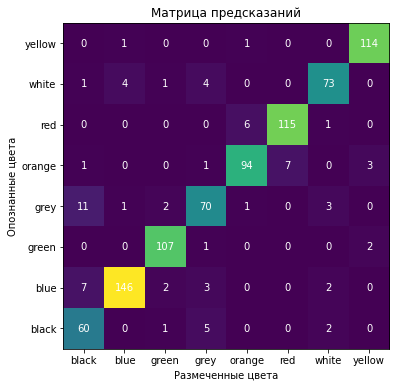

In [33]:
if not skip_training_and_load_classifier_from_file:
    predictions_proba = ( model_svm.predict_proba(features_test_kaggle) + model_lgbm.predict_proba(features_test_kaggle) )/2
    predictions_test = np.argmax(predictions_proba, axis=1)
    error_histogram = np.histogram2d( predictions_test, targets_test_kaggle, bins=len(car_colors))[0].astype(int)
    test_error_data = pd.DataFrame( np.concatenate((targets_test_kaggle[None,:], predictions_test[None,:])).T, columns=('target', 'prediction') )

    fig, ax = plt.subplots(figsize=(6,6))
    plt.imshow(error_histogram)

    plt.gca().set_xticks(np.arange(len(car_colors)), labels=car_colors)
    plt.gca().set_yticks(np.arange(len(car_colors)), labels=car_colors)
    plt.gca().invert_yaxis()
            
    for i, j in itertools.product( range(len(car_colors)), range(len(car_colors)) ):
        ax.text(j, i, error_histogram[i, j], ha="center", va="center", color="w")

    ax.set_title('Матрица предсказаний')
    plt.xlabel('Размеченные цвета')
    plt.ylabel('Опознанные цвета')
    plt.show()

Из матрицы видно, что в основном путаются близкие цвета: красный и оранжевый, серый и черный и.т.д. Покажем, что значительная доля ошибок является ошибками разметки данных:

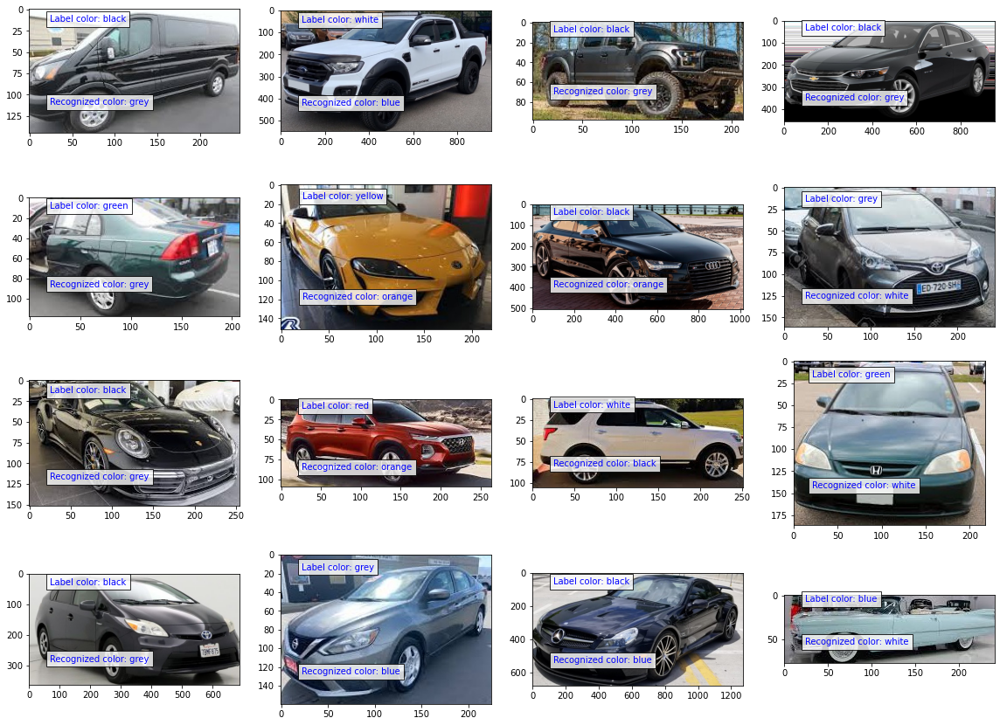

In [34]:
if not skip_training_and_load_classifier_from_file:
    wrong_index = test_error_data[ test_error_data['target']!=test_error_data['prediction'] ].index.values
    wrong_index = shuffle(wrong_index, random_state=42)

    nx = 4
    ny = 4
    fig, axes = plt.subplots(ny, nx, figsize=(16,ny*3))
    axes = axes.flatten()

    for idx, ax in zip( wrong_index, axes):
        image = images_test_kaggle[idx]
        ax.imshow(image)
        sx, sy = int(image.size[0]/10), int(image.size[1]/10)
        ax.text(sx, sy, 'Label color: ' + car_colors[targets_test_kaggle[idx]], color="b", bbox=dict(facecolor='white', alpha=0.8))
        ax.text(sx, sy*8, 'Recognized color: ' + car_colors[predictions_test[idx]], color="b", bbox=dict(facecolor='white', alpha=0.8))

    fig.tight_layout()

##### 7.6. Обработка полнокадровых изображений

In [35]:
example_image_list = []
example_filename_list = []
for filename in glob.glob( os.path.join(input_image_folder, '*.jpg') ):
    image = Image.open(filename)
    example_image_list.append(image)
    example_filename_list.append( os.path.basename(filename) )

In [36]:
inputs = [utils.prepare_input(image_file) for image_file in glob.glob( os.path.join(input_image_folder, '*.jpg') )]
tensor = utils.prepare_tensor(inputs)

with torch.no_grad():
    detections_batch = model_SSD(tensor)

results_per_input = utils.decode_results(detections_batch)
best_results_per_input = [utils.pick_best(results, 0.40) for results in results_per_input]

classes_to_labels = utils.get_coco_object_dictionary()

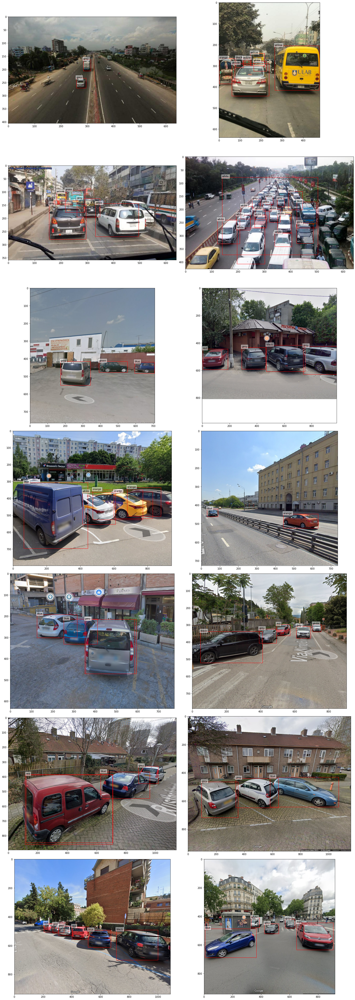

In [37]:
crop = 0.8  # доля площади локализованного bounding box, используемая для классификации
nx = 2
ny = math.ceil(len(best_results_per_input)/nx)
fig, axes = plt.subplots(ny, nx, figsize=(20,ny*8))
axes = axes.flatten()

for ax, image_idx in zip(axes, range(len(best_results_per_input))):
    image = np.array(example_image_list[image_idx])
    image_FCN = transform_image_FCN(image, model_FCN)
    min_size = min(image.shape[:2])
    x_offset = (image.shape[1] - min_size) // 2
    y_offset = (image.shape[0] - min_size) // 2
    ax.imshow(image)
    
    bboxes, classes, confidences = best_results_per_input[image_idx]
    for idx in range(len(bboxes)):
        left, bot, right, top = np.array(bboxes[idx]*min_size).astype(int) + np.array( (x_offset, y_offset, x_offset, y_offset) )
        x, y, w, h = [left, bot, (right - left), (top - bot)]
        left, bot, right, top = np.array((left, bot, right, top)) + ( np.array((w, h, -w, -h))*(1-crop)/2 ).astype(int)
        rect = patches.Rectangle((x, y), w, h, linewidth=1, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
        object_class = classes_to_labels[classes[idx] - 1]
        if (object_class=='car') | (object_class=='bus'):
            object_image = np.array(image)[bot:top, left:right, :]
            object_image_FCN = image_FCN[bot:top, left:right]
            object_color = one_car_classifier.detect_car_color(object_image, object_image_FCN)
            ax.text(x, y, object_color, bbox=dict(facecolor='white', alpha=0.5))

fig.tight_layout()

if not os.path.isdir(output_image_folder):
    os.makedirs(output_image_folder)

for ax, filename in zip(axes, example_filename_list):
    extent = ax.get_window_extent().transformed(fig.dpi_scale_trans.inverted())
    output_filename = os.path.join(output_image_folder, filename)
    #if os.path.isfile(output_filename):
    #    os.remove(output_filename) 
    fig.savefig( output_filename, bbox_inches=extent)

plt.show()